In [1]:
import os
import gc
import sys
import glob
import numpy as np
import pandas as pd
import netCDF4 as nc
from datetime import datetime, timedelta
from matplotlib.cm import get_cmap
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib import colors
import matplotlib.ticker as mticker
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import multiprocessing as mp
from sklearn.linear_model import LinearRegression
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns
from sklearn.metrics import r2_score

In [2]:
# To use PLUMBER2_GPP_common_utils, change directory to where it exists
os.chdir('/g/data/w97/mm3972/scripts/PLUMBER2/LSM_GPP_PLUMBER2')
from PLUMBER2_GPP_common_utils import *

In [3]:
# Path of PLUMBER 2 dataset
PLUMBER2_path      = "/g/data/w97/mm3972/data/PLUMBER2/"
PLUMBER2_flux_path = "/g/data/w97/mm3972/data/Fluxnet_data/Post-processed_PLUMBER2_outputs/Nc_files/Flux/"
PLUMBER2_met_path  = "/g/data/w97/mm3972/data/Fluxnet_data/Post-processed_PLUMBER2_outputs/Nc_files/Met/"

site_names, IGBP_types, clim_types, model_names = load_default_list()

remove_site        = get_removed_site_names()

models_calc_LAI   = ['ORC2_r6593','ORC2_r6593_CO2','ORC3_r7245_NEE','ORC3_r8120','GFDL','SDGVM','QUINCY','NoahMPv401']
model_LAI_names   = {'ORC2_r6593':'lai','ORC2_r6593_CO2':'lai','ORC3_r7245_NEE':'lai','ORC3_r8120':'lai',
                     'GFDL':'lai', 'SDGVM':'lai','QUINCY':'LAI','NoahMPv401':'LAI'} #

# Calculate remaining sites
set_site_names      = set(site_names)
set_remove_site     = set(remove_site)
remain_sites        = set_site_names - set_remove_site
remain_sites        = list(remain_sites)

In [4]:
model_colors ={0:'red', 1: 'darkorange',2:'orange',3:'gold',4:'yellowgreen',5:'green',6:'mediumseagreen',
               7:'lime',8:'aquamarine',9:'cyan',10:'dodgerblue',11:'blue',12:'darkolivegreen',
               13:'forestgreen',14:'lime',15:'gold', 16:'orange',17:'pink',18:'pink',19:'red',20:'deeppink',
               21:'mediumorchid',22: 'darkviolet',}

IGBP_colors  = set_IGBP_colors()
clim_colors  = set_clim_colors()

<h5 style="color:orange;">Plot model vs obs NEE, GPP</h5>  

In [11]:
def plot_modelled_vs_observed(var_name, model_in, plot_type=None):
    
    site_names, IGBP_types, clim_types, model_names = load_default_list()
    if var_name == 'LAI':
        df_obs   = pd.read_csv(f'./txt/NEE_annual_value/NEE_annual_value_obs.csv')
        df_model = pd.read_csv(f'./txt/NEE_annual_value/NEE_annual_value_{model_in}.csv')
    else:
        df_obs   = pd.read_csv(f'./txt/{var_name}_annual_value/{var_name}_annual_value_obs.csv')
        df_model = pd.read_csv(f'./txt/{var_name}_annual_value/{var_name}_annual_value_{model_in}.csv')

    var_max  = np.nanmax((df_model[var_name], df_obs[var_name]))
    var_min  = np.nanmin((df_model[var_name], df_obs[var_name]))
    print(var_max, var_min)
    fig = plt.figure(figsize=(5, 5))
    ax  = plt.axes()
    
    if plot_type == 'IGBP':
        
        IGBP_unique = np.unique(df_model['IGBP'])
        
        # r_ranks     = pd.DataFrame(IGBP_unique, columns=[plot_type])
        # r_ranks['r']= np.zeros
        
        metrics                    = pd.DataFrame(['']*len(IGBP_unique), columns=['IGBP'])
        metrics['total_site_year'] = np.zeros(len(IGBP_unique))
        metrics['r']               = np.zeros(len(IGBP_unique))
        metrics['R2']              = np.zeros(len(IGBP_unique))
        
        for i, IGBP in enumerate(IGBP_unique):

            # print('IGBP',IGBP)
            
            # Create and fit the linear regression model
            obs       = df_obs.loc[   df_obs['IGBP']   == IGBP, var_name].values
            model     = df_model.loc[ df_model['IGBP'] == IGBP, var_name].values
            
            # Calculate correlation coefficient
            correlation_coeff = np.corrcoef(model, obs)[0, 1]
            
            metrics.loc[i, 'IGBP']            = IGBP
            metrics.loc[i, 'total_site_year'] = len(obs)
            metrics.loc[i, 'r']               = correlation_coeff
            
            # r_ranks.loc[plot_type == IGBP] = correlation_coeff
            
            if len(obs) > 3:
                try:
                    reg_model = LinearRegression()
                    reg_model.fit(obs.reshape(-1, 1),model.reshape(-1, 1))

                    # Predict based on obs
                    obs_min   = np.min(obs)
                    obs_max   = np.max(obs)
                    obs_pred  = np.arange(obs_min, obs_max, (obs_max-obs_min)/100)
                    model_pred = reg_model.predict(obs_pred.reshape(-1, 1)) # 

                    model_pred_for_r2 = reg_model.predict(obs.reshape(-1, 1))  # Use original obs
                    r_squared = r2_score(model, model_pred_for_r2)

                    # print('obs_pred, model_pred',obs_pred, model_pred)
                    # Plot the regression line
                    # Plot the data points
                    # plot1 = ax.scatter(obs, model, edgecolors=IGBP_colors[IGBP], alpha=0.5, facecolors='none', label=f'{IGBP} r={correlation_coeff:.2f} R²={r_squared:.2f}')
                    plot1 = ax.scatter(obs, model, edgecolors=IGBP_colors[IGBP], alpha=0.5, 
                                       facecolors='none', label=f'{IGBP} {correlation_coeff:.2f} {r_squared:.2f}')
                    plot1 = ax.plot(obs_pred, model_pred, color=IGBP_colors[IGBP],alpha=0.9)
                except:
                    print(f'{IGBP} has nan')
                    continue
                metrics.loc[i,'R2'] = r_squared
                
            else:
                plot1 = ax.scatter(obs, model, edgecolors=IGBP_colors[IGBP], alpha=0.5, facecolors='none', label=f'{IGBP} r={correlation_coeff:.2f}')
                metrics.loc[i,'R2'] = np.nan
                
    elif plot_type == 'clim_type':
        
        df_clim               = pd.read_csv(f'./txt/site_character.csv')
        df_obs['clim_type']   = 'unused'
        df_model['clim_type'] = 'unused'
        
        for s in np.unique(df_obs['site_name']):

            # Retrieve the clim_type for the current site
            clim_values = df_clim.loc[df_clim['site_name'] == s, 'clim_type'].values

            # Ensure we only assign if there's a corresponding value in df_clim
            if clim_values.size > 0:
                # Assign the clim_type values
                df_obs.loc[df_obs['site_name'] == s, 'clim_type'] = clim_values[0]
                df_model.loc[df_model['site_name'] == s, 'clim_type'] = clim_values[0]
            else:
                print(f"No climate type found for site {s}")

        clim_unique           = np.unique(df_model['clim_type'])
                
        metrics                    = pd.DataFrame(['']*len(clim_unique), columns=['clim_type'])
        metrics['total_site_year'] = np.zeros(len(clim_unique))
        metrics['r']               = np.zeros(len(clim_unique))
        metrics['R2']              = np.zeros(len(clim_unique))
        
        for i, clim in enumerate(clim_unique):
            
            # Create and fit the linear regression model
            obs       = df_obs.loc[   df_obs['clim_type']   == clim, var_name].values
            model     = df_model.loc[ df_model['clim_type'] == clim, var_name].values
            
            # Calculate correlation coefficient
            correlation_coeff = np.corrcoef(model, obs)[0, 1]
            
            metrics.loc[i, 'clim_type']       = clim
            metrics.loc[i, 'total_site_year'] = len(obs)
            metrics.loc[i, 'r']               = correlation_coeff
            
            if len(obs) > 3:
                try:
                    reg_model = LinearRegression()
                    reg_model.fit(obs.reshape(-1, 1),model.reshape(-1, 1))

                    # Predict based on obs
                    obs_min   = np.min(obs)
                    obs_max   = np.max(obs)
                    obs_pred  = np.arange(obs_min, obs_max, (obs_max-obs_min)/100)
                    model_pred = reg_model.predict(obs_pred.reshape(-1, 1)) # 

                    model_pred_for_r2 = reg_model.predict(obs.reshape(-1, 1))  # Use original obs
                    r_squared = r2_score(model, model_pred_for_r2)

                    # print('obs_pred, model_pred',obs_pred, model_pred)
                    # Plot the regression line
                    # Plot the data points
                    # plot1 = ax.scatter(obs, model, edgecolors=clim_colors[clim], alpha=0.5, facecolors='none', label=f'{clim} r={correlation_coeff:.2f} R²={r_squared:.2f}')
                    plot1 = ax.scatter(obs, model, edgecolors=clim_colors[clim], alpha=0.5,
                                       facecolors='none', label=f'{clim} {correlation_coeff:.2f} {r_squared:.2f}')
                    plot1 = ax.plot(obs_pred, model_pred, color=clim_colors[clim],alpha=0.9)
                except:
                    print(f'{IGBP} has nan')
                    continue
                metrics.loc[i,'R2'] = r_squared
            else:
                plot1 = ax.scatter(obs, model, edgecolors=clim_colors[clim], alpha=0.5, facecolors='none', label=f'{clim} r={correlation_coeff:.2f}')
                metrics.loc[i,'R2'] = np.nan
            
    elif plot_type == None:
        ndata    = len(df_obs)
        for i in np.arange(ndata):
            plot = ax.scatter(df_obs.loc[i,var_name], df_model.loc[i,var_name])#,color=df_model.loc[i,'IGBP'])
    
    # r_ranks.sort_values(by='r')
    
    # Create and fit the linear regression model
    obs       = df_obs[var_name].values
    model     = df_model[var_name].values
    obs_mask  = ~np.isnan(obs)
    
    if model_in == 'QUINCY':
        
        print('Check negative values in QUINCY', df_model[df_model[var_name].values < 0]['site_name'])
        
        
    reg_model = LinearRegression()
    reg_model.fit(obs[obs_mask].reshape(-1, 1),model[obs_mask].reshape(-1, 1))

    # Predict based on obs
    obs_min   = np.nanmin(obs)
    obs_max   = np.nanmax(obs)
    obs_pred  = np.arange(obs_min, obs_max, (obs_max-obs_min)/100)
    model_pred = reg_model.predict(obs_pred.reshape(-1, 1))

    # Plot the regression line
    plot1 = ax.plot(obs_pred, model_pred, color='black',alpha=0.9)
    
    # Add x = 0 and y = 0 lines on scatter plot
    plot1 = ax.axvline(x=0, color='black', linestyle='--', linewidth=1)  # Vertical line (x=0)
    plot1 = ax.axhline(y=0, color='black', linestyle='--', linewidth=1)  # Horizontal line (y=0)

    ax.set_xlabel('Observed')
    if model_in in models_calc_LAI:
        ax.set_ylabel(f'{model_in}*')
    else:
        ax.set_ylabel(model_in)

    # Create dividers for the PDFs
    divider = make_axes_locatable(ax)

    # PDF for observed (top of scatter plot)
    ax_top = divider.append_axes("top", 0.5, pad=0.2, sharex=ax)
    ax_top.axvline(x=0, color='black', linestyle='--', linewidth=1)  # Add x = 0 line on top PDF
    sns.kdeplot(obs, ax=ax_top, color='green',label='obs')
    sns.kdeplot(model, ax=ax_top, color='red',label='model')#
    ax_top.get_xaxis().set_visible(False)  # Hide x-axis labels
    ax_top.set_ylabel('Density')
    if var_name == 'NEE':
        ax_top.set_ylim(0,0.005)
    # elif var_name == 'LAI':
    #     ax_top.set_ylim(0,20)
    elif var_name == 'GPP':
        ax_top.set_ylim(0,0.0012)
    # # PDF for modeled (right of scatter plot)
    # ax_right = divider.append_axes("right", 0.5, pad=0.2, sharey=ax)
    # ax_right.axhline(y=0, color='black', linestyle='--', linewidth=1)  # Add y = 0 line on right PDF
    # sns.kdeplot(model, ax=ax_right, color='red', vertical=True)
    # ax_right.get_yaxis().set_visible(False)  # Hide y-axis labels
    # ax_right.set_xlabel('Density')

    plot = ax.plot(np.arange(var_min, var_max,(var_max-var_min)/100), np.arange(var_min, var_max,(var_max-var_min)/100),color='black', ls='dashed')
    if var_name == 'NEE':
        ax.set_xlim(-3000,1500)
        ax.set_ylim(-3000,1500)
    # elif var_name == 'LAI':
    #     ax.set_xlim(0,20)
    #     ax.set_ylim(0,20)
    elif var_name == 'GPP':
        ax.set_xlim(-2500,5000)
        ax.set_ylim(-2500,5000)
        
    # ax.set_title(f'{var_name} {model_in}')

    
    ax.legend(frameon=False,fontsize=7, ncols=3)
    # ax.plot(np.linspace(var_min,var_max,100),np.linspace(var_min,var_max,100),color='black')

    # Get the directory path
    directory = f'./plots/{var_name}_model_vs_obs/'
    # Create the directory if it doesn't exist
    if not os.path.exists(directory):
        os.makedirs(directory, exist_ok=True)
    plt.tight_layout()
    plt.savefig(f'{directory}{var_name}_{model_in}_vs_obs_{plot_type}.png',dpi=300)
    
    return

648.60693 -2146.4497
648.60693 -2146.4497
648.60693 -2146.4497
648.60693 -2146.4497
648.60693 -2146.4497
648.60693 -2146.4497
648.60693 -2146.4497
648.60693 -2146.4497
735.4197 -2146.4497
735.4197 -2146.4497
735.4197 -2146.4497
735.4197 -2146.4497
648.60693 -2146.4497
648.60693 -2146.4497
648.60693 -2146.4497
648.60693 -2146.4497
840.738 -2429.1045
840.738 -2429.1045
886.47174 -2146.4497
886.47174 -2146.4497
1321.6833 -2146.4497


/jobfs/126278269.gadi-pbs/ipykernel_2062583/2085660067.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(5, 5))


1321.6833 -2146.4497
648.60693 -2146.4497
648.60693 -2146.4497
1827.9354 -3015.0303
1827.9354 -3015.0303
1634.6528 -5206.729
1634.6528 -5206.729
648.60693 -2146.4497
648.60693 -2146.4497
648.60693 -2146.4497
648.60693 -2146.4497
648.60693 -2146.4497
Check negative values in QUINCY 1      CH-Cha
4      CH-Cha
5      CH-Cha
6      CH-Cha
8      CH-Cha
        ...  
971    ES-LMa
972    UK-Ham
973    DK-Ris
974    DK-Ris
975    US-Bkg
Name: site_name, Length: 633, dtype: object
648.60693 -2146.4497
Check negative values in QUINCY 1      CH-Cha
4      CH-Cha
5      CH-Cha
6      CH-Cha
8      CH-Cha
        ...  
971    ES-LMa
972    UK-Ham
973    DK-Ris
974    DK-Ris
975    US-Bkg
Name: site_name, Length: 633, dtype: object
1467.1582 -2707.961
1467.1582 -2707.961
648.60693 -2146.4497
648.60693 -2146.4497


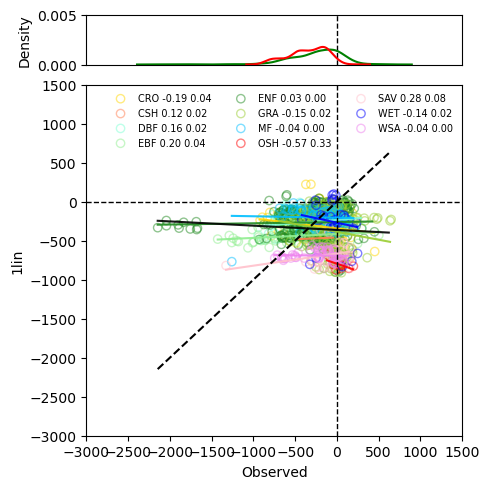

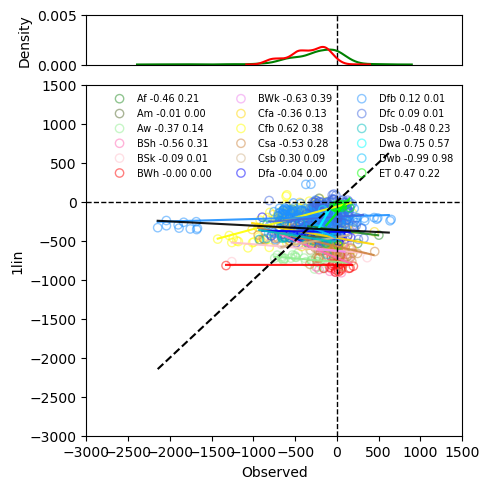

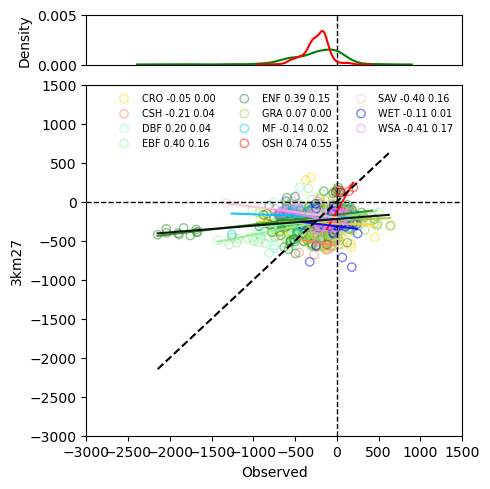

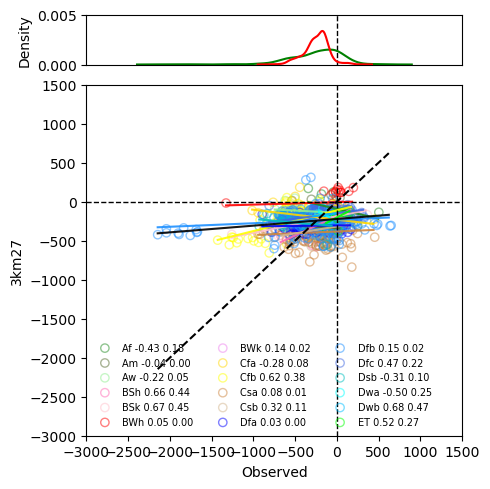

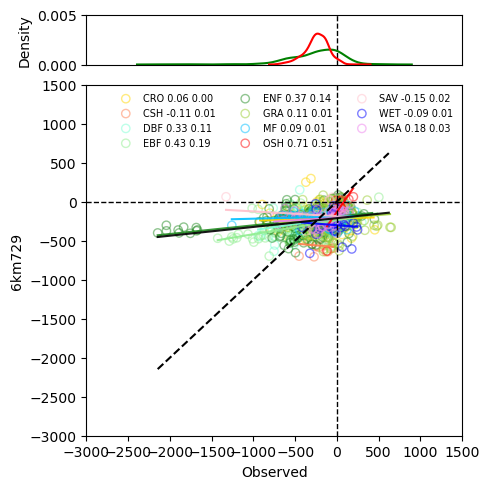

...

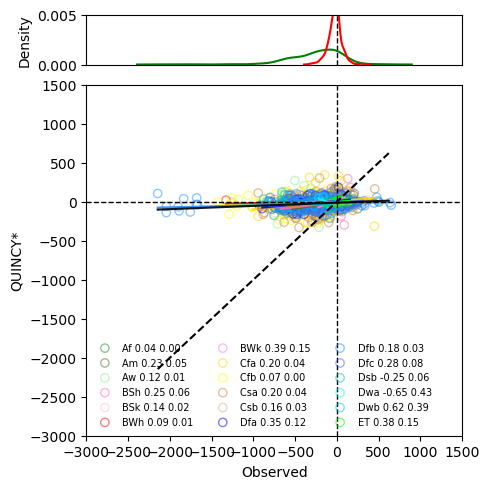

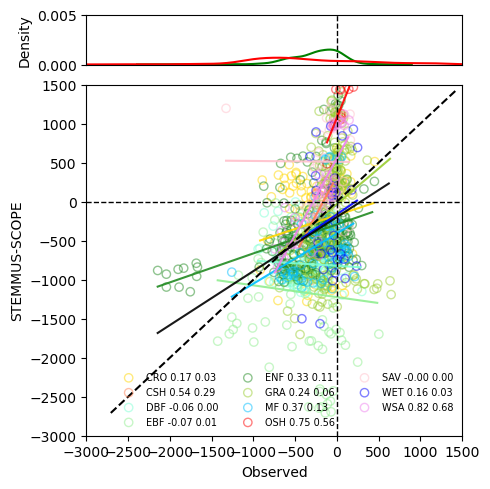

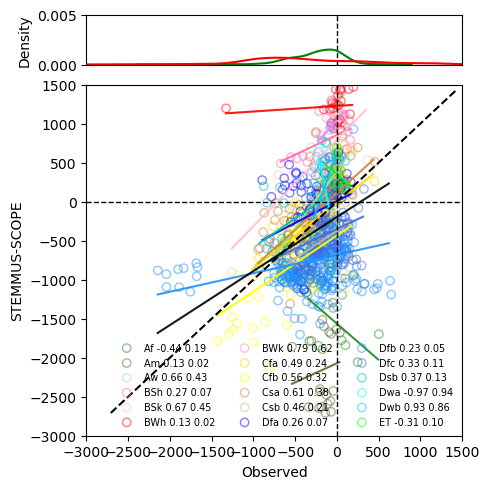

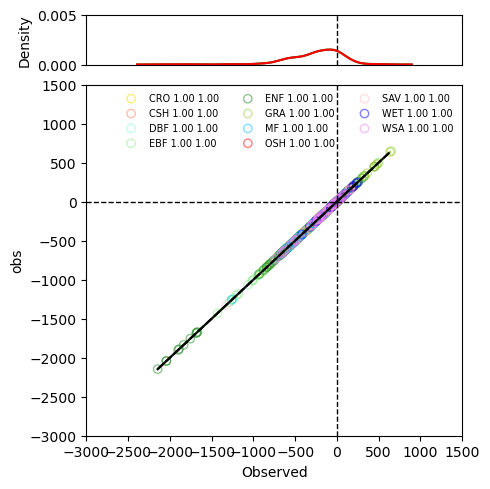

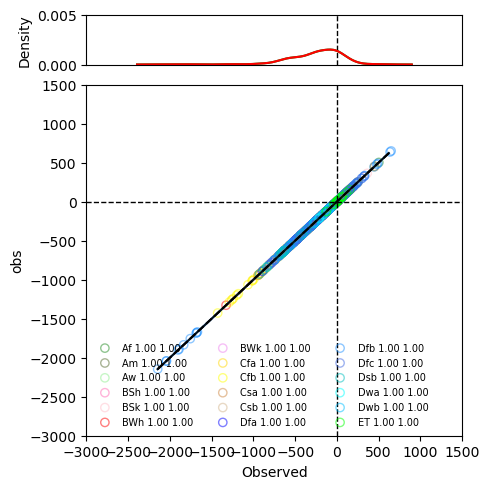

In [12]:
var_name  = 'NEE'
f              = nc.Dataset('/g/data/w97/mm3972/scripts/PLUMBER2/LSM_GPP_PLUMBER2/nc_files/AU-Tum.nc', mode='r')
model_list     = f.variables[f'{var_name}_models'][:]
model_list     = model_list.tolist()
model_list.append('obs')
f.close()

for model_in in model_list:
    plot_type = 'IGBP'#'IGBP' #'clim_type'
    plot_modelled_vs_observed(var_name, model_in, plot_type=plot_type)
    plot_type = 'clim_type'#'IGBP' #'clim_type'
    plot_modelled_vs_observed(var_name, model_in, plot_type=plot_type)

5000.921 -2515.967
5000.921 -2515.967
5834.443 -2515.967
5834.443 -2515.967
3955.4512 -2515.967
3955.4512 -2515.967
3955.4512 -2515.967
3955.4512 -2515.967
4026.652 -2515.967
4026.652 -2515.967
3955.4512 -2515.967
3955.4512 -2515.967
3955.4512 -2515.967
3955.4512 -2515.967
4423.8657 -2515.967
4423.8657 -2515.967
3955.4512 -2515.967
3955.4512 -2515.967
3955.4512 -2515.967
3955.4512 -2515.967
3955.4512 -2515.967


/jobfs/126127291.gadi-pbs/ipykernel_1168791/2343868780.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(5, 5))


3955.4512 -2515.967
4198.06 -2515.967
4198.06 -2515.967
3955.4512 -2515.967
3955.4512 -2515.967


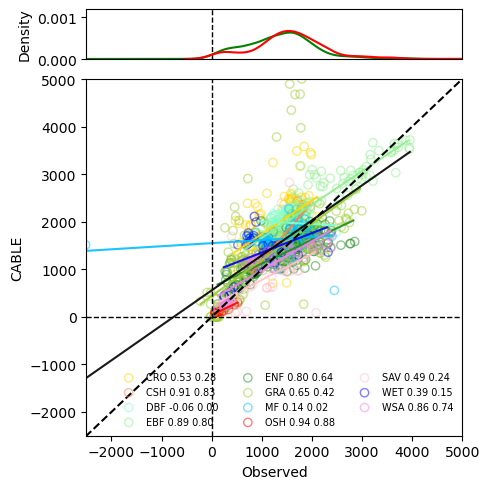

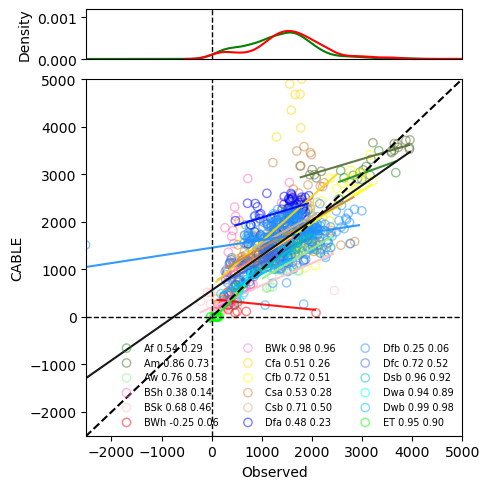

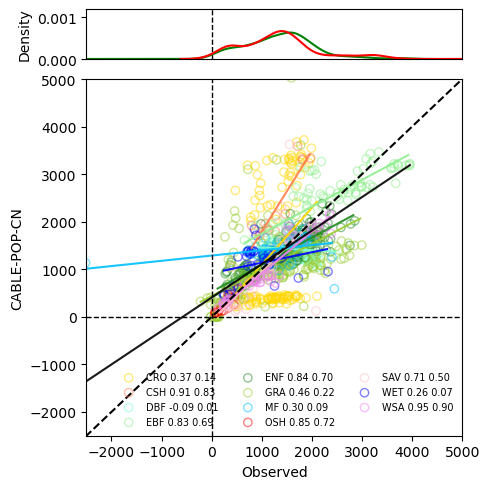

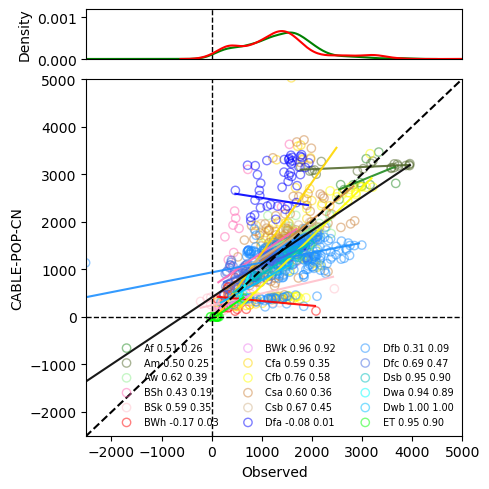

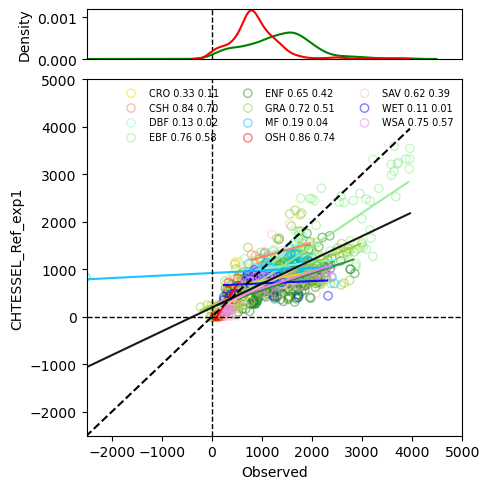

...

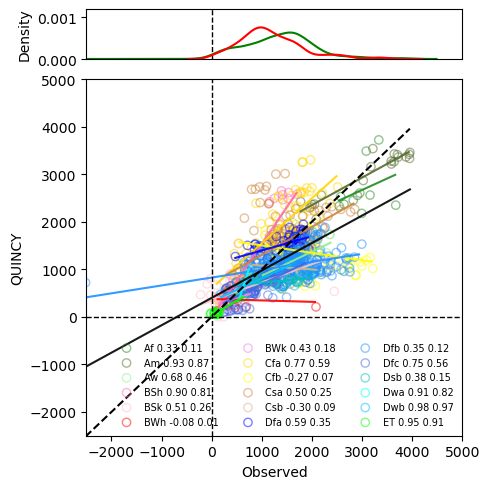

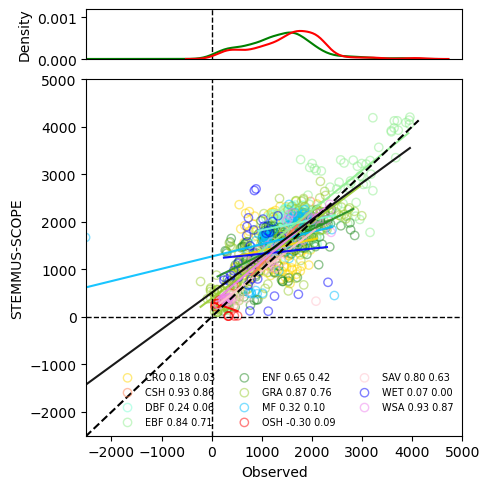

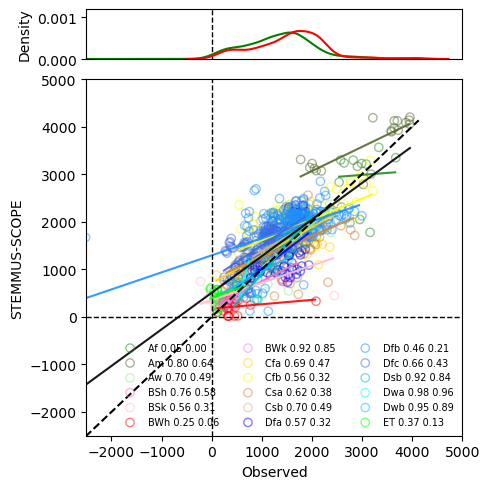

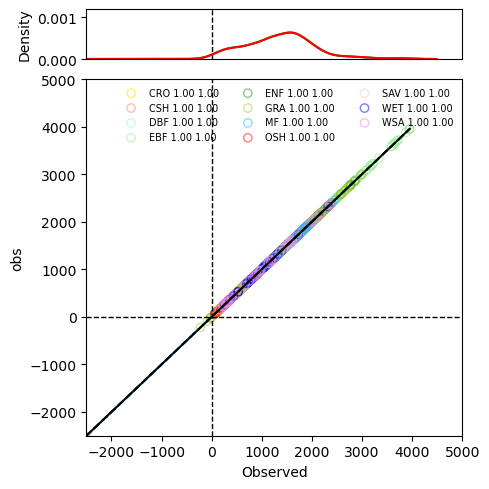

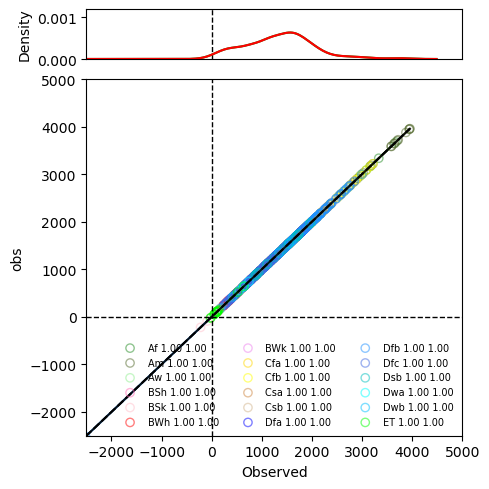

In [9]:
var_name  = 'GPP'
f              = nc.Dataset('/g/data/w97/mm3972/scripts/PLUMBER2/LSM_GPP_PLUMBER2/nc_files/AU-Tum.nc', mode='r')
model_list     = f.variables[f'{var_name}_models'][:]
model_list     = model_list.tolist()
model_list.append('obs')
f.close()

for model_in in model_list:
    plot_type = 'IGBP'#'IGBP' #'clim_type'
    plot_modelled_vs_observed(var_name, model_in, plot_type=plot_type)
    plot_type = 'clim_type'#'IGBP' #'clim_type'
    plot_modelled_vs_observed(var_name, model_in, plot_type=plot_type)

6.216037 0.14194769
6.216037 0.14194769
6.216037 0.14194769
6.216037 0.14194769
6.216037 0.14194769
6.216037 0.14194769
6.216037 0.14194769
6.216037 0.14194769
6.216037 0.14194769
6.216037 0.14194769
6.216037 0.14194769
6.216037 0.14194769
6.216037 0.14194769
6.216037 0.14194769
6.216037 0.14194769
6.216037 0.14194769
6.216037 0.14194769
6.216037 0.14194769
6.216037 0.14194769
6.216037 0.14194769
6.216037 0.14194769


/jobfs/126278269.gadi-pbs/ipykernel_2062583/2085660067.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(5, 5))


6.216037 0.14194769
8.430816 0.00016881264
8.430816 0.00016881264
6.216037 0.14194769
6.216037 0.14194769
6.216037 0.13423193
6.216037 0.13423193
6.39024471981495 0.018007913915234
6.39024471981495 0.018007913915234
6.600496200666036 5.877077539393489e-20
6.600496200666036 5.877077539393489e-20
7.6052003 0.0
Check negative values in QUINCY Series([], Name: site_name, dtype: object)
7.6052003 0.0
Check negative values in QUINCY Series([], Name: site_name, dtype: object)
6.216037 0.14194769
6.216037 0.14194769
6.216037 0.14194769
6.216037 0.14194769


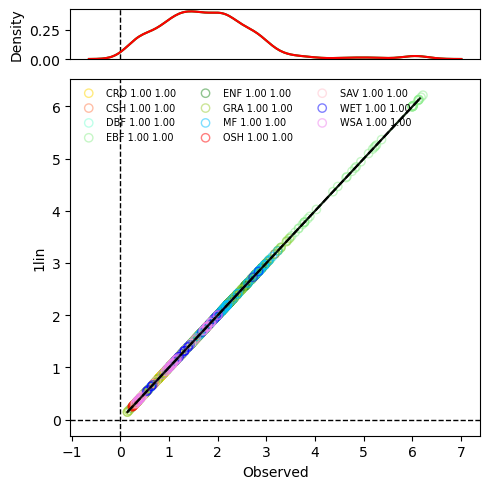

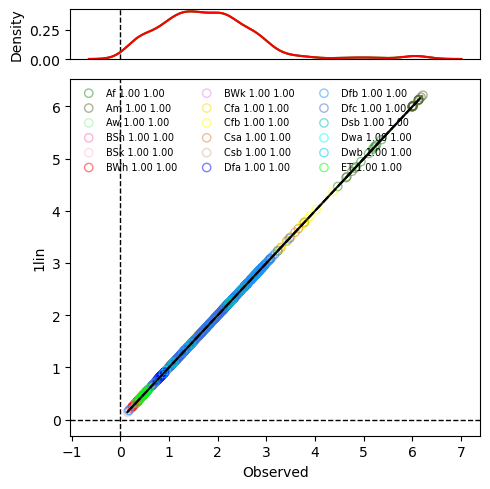

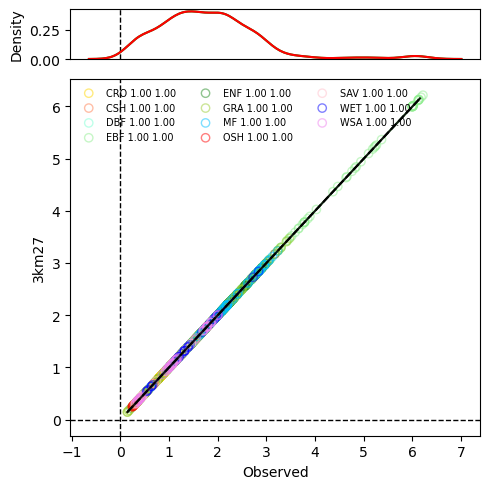

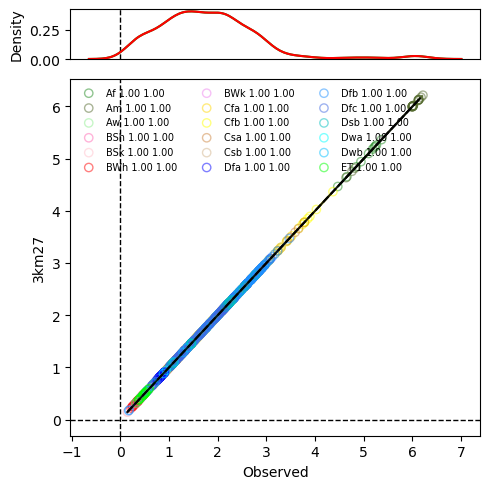

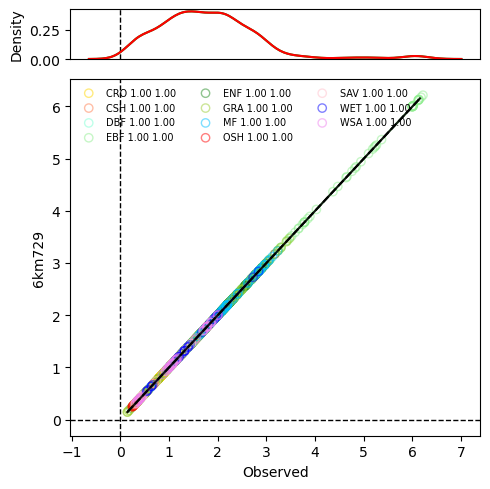

...

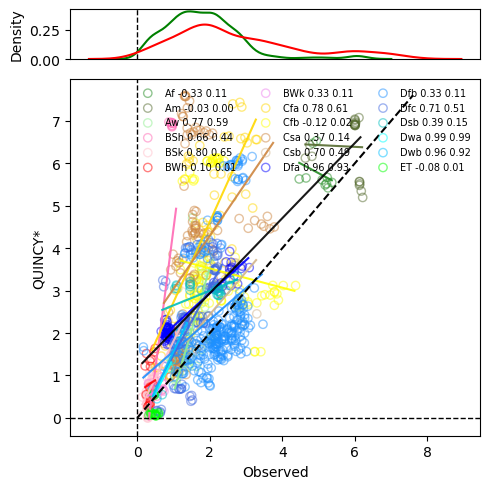

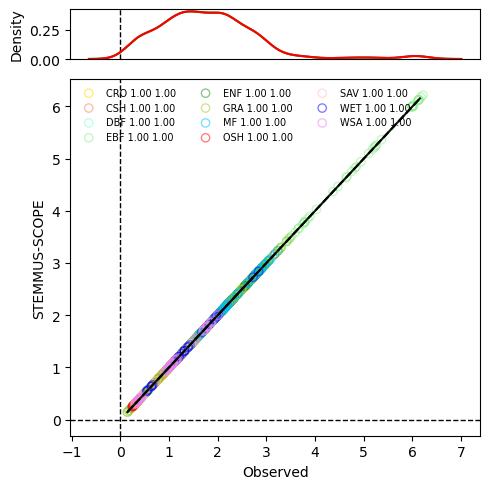

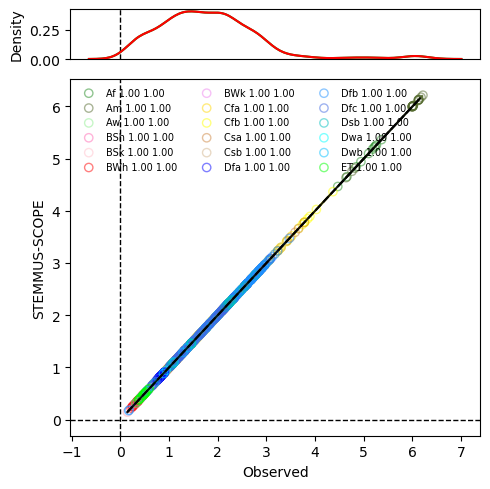

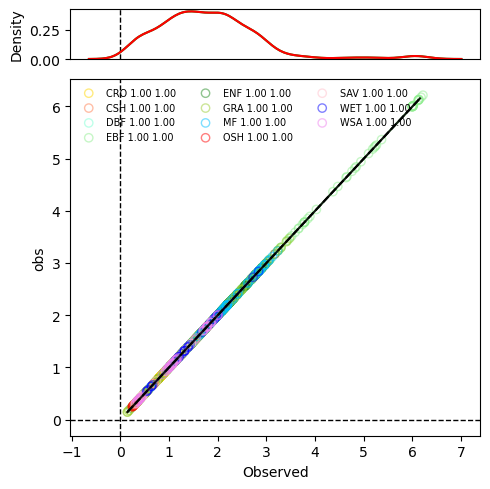

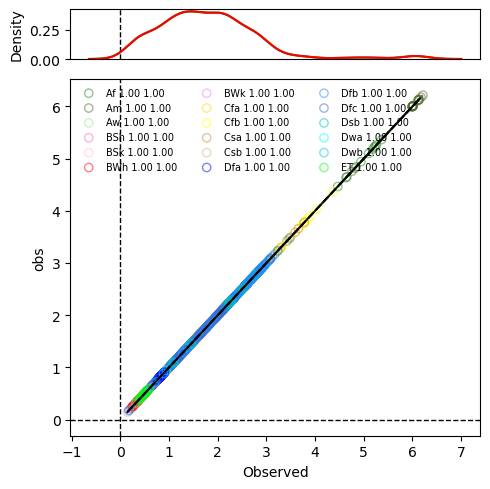

In [13]:
var_name  = 'LAI'
f              = nc.Dataset('/g/data/w97/mm3972/scripts/PLUMBER2/LSM_GPP_PLUMBER2/nc_files/AU-Tum.nc', mode='r')
model_list     = f.variables[f'NEE_models'][:]
model_list     = model_list.tolist()
model_list.append('obs')
f.close()

for model_in in model_list:
    plot_type = 'IGBP'#'IGBP' #'clim_type'
    plot_modelled_vs_observed(var_name, model_in, plot_type=plot_type)
    plot_type = 'clim_type'#'IGBP' #'clim_type'
    plot_modelled_vs_observed(var_name, model_in, plot_type=plot_type)